# Course project for Zero to GMS with Python


In [1]:
project_name='Zero_to_GBMs_Course_project_Komlikis_Ioannis'

### Step 1: Identify a real-world dataset in which we will work on and download it

The model we will work with concerns the Airlines passengers satisfaction which could be considered as a `Classification` problem

First, we are downloading our dataset


In [2]:
import opendatasets as od
import os
import pandas as pd

In [3]:
od.download('https://www.kaggle.com/datasets/mysarahmadbhat/airline-passenger-satisfaction')

Skipping, found downloaded files in ".\airline-passenger-satisfaction" (use force=True to force download)


In [4]:
os.listdir()

['.ipynb_checkpoints',
 '.jovianrc',
 'airline-passenger-satisfaction',
 'airline_satis_Dec_Tree.joblib',
 'airline_satis_log_reg.joblib',
 'airline_satis_Rand_For.joblib',
 'aussie_rain.joblib',
 'Course_project.ipynb',
 'Decision trees and hyperparameters.ipynb',
 'execute.py',
 'Gradient Boosting with XGBoost.ipynb',
 'Introduction to scikit and machine learning.ipynb',
 'Logistic regression for classification.ipynb',
 'Machine learning with Python',
 'medical.csv',
 'rossmann-store-sales',
 'submission.csv',
 'test_inputs.parquet',
 'test_targets.parquet',
 'train_inputs.parquet',
 'train_targets.parquet',
 'Unsupervised Machine Learning.ipynb',
 'Untitled.ipynb',
 'Untitled1.ipynb',
 'Untitled2.ipynb',
 'Untitled3.ipynb',
 'Untitled4.ipynb',
 'val_inputs.parquet',
 'val_targets.parquet',
 'weather-dataset-rattle-package']

In [5]:
os.listdir('./airline-passenger-satisfaction')

['airline_passenger_satisfaction.csv', 'data_dictionary.csv']

As it can be seen in the above line of code, the file containd to `csv` files; `airline_passenger_satisfaction.csv` contains our data and `data_dictionary.csv` provides a brief explanation of our features (columns).

In [6]:
#We read the file
data_df=pd.read_csv('./airline-passenger-satisfaction/airline_passenger_satisfaction.csv')

In [7]:
data_df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [8]:
dict_df=pd.read_csv('./airline-passenger-satisfaction/data_dictionary.csv')

In [9]:
dict_df

,Field,Description
0,ID,Unique passenger identifier
1,Gender,Gender of the passenger (Female/Male)
2,Age,Age of the passenger
3,Customer Type,Type of airline customer (First-time/Returning)
4,Type of Travel,Purpose of the flight (Business/Personal)
5,Class,Travel class in the airplane for the passenger...
6,Flight Distance,Flight distance in miles
7,Departure Delay,Flight departure delay in minutes
8,Arrival Delay,Flight arrival delay in minutes
9,Departure and Arrival Time Convenience,Satisfaction level with the convenience of the...


### Step 2: Comprehension of our Dataset and description of the model's objective

The Dataset we currently work on, contains data concerning the satisfaction of airline customers based on a number of features that are given in the columns of the `data_df` and that their meaning are described from the `dict_df`. This is a classification problem since the outcome of our model will be a 'Yes' or 'No' answer that corresponds to if the passenger is satisfied with its flight or not. The target values will be those of the `Satisfaction` column and the rest will be used as input parameters to build a model which will predict with the highest accuracy possible the satisfaction of the customers based on a given input of those parameters

### Step 3: Preparation of the Data for modelling

In [10]:
#First, let's import some libraries necessary for the exploratory data analysis
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size']=14
matplotlib.rcParams['figure.figsize']=(10,6)


In [11]:
# let's obtain some info about our dataset and see if some modification are necessary
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  object 
 2   Age                                     129880 non-null  int64  
 3   Customer Type                           129880 non-null  object 
 4   Type of Travel                          129880 non-null  object 
 5   Class                                   129880 non-null  object 
 6   Flight Distance                         129880 non-null  int64  
 7   Departure Delay                         129880 non-null  int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

Our data contain int, float and categorical data.

In [12]:
data_df.describe()

,ID,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,64940.500000,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,37493.270818,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,32470.750000,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,64940.500000,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,97410.250000,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,129880.000000,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


So far, there is no need to modify our data since everything seems reasonable and consistent with what we would expect

In [13]:
data_df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [14]:
px.histogram(data_df, x='Type of Travel',color='Satisfaction', title='Travel type vs Satisfaction')

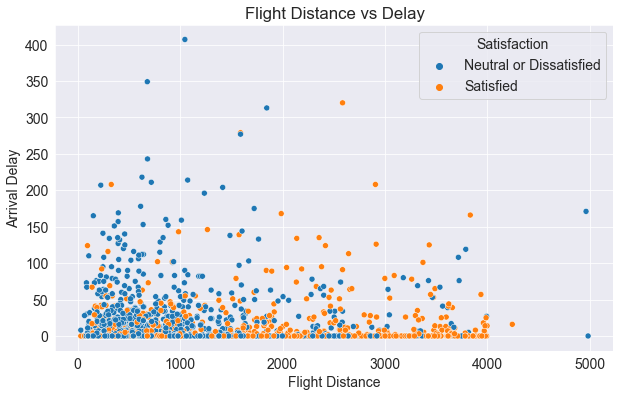

In [15]:
sns.scatterplot(data=data_df.sample(2000), x='Flight Distance', y='Arrival Delay', hue='Satisfaction');
plt.title('Flight Distance vs Delay');

In [16]:
px.histogram(data_df, x='Class', color='Satisfaction', title='Class vs Satisfaction')

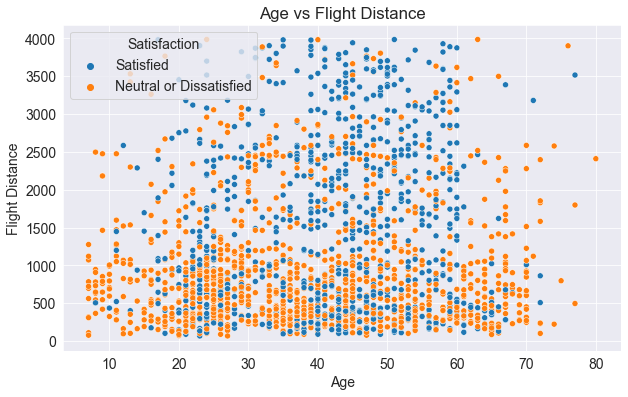

In [17]:
sns.scatterplot(data=data_df.sample(2000), x='Age', y='Flight Distance', hue='Satisfaction');
plt.title('Age vs Flight Distance');

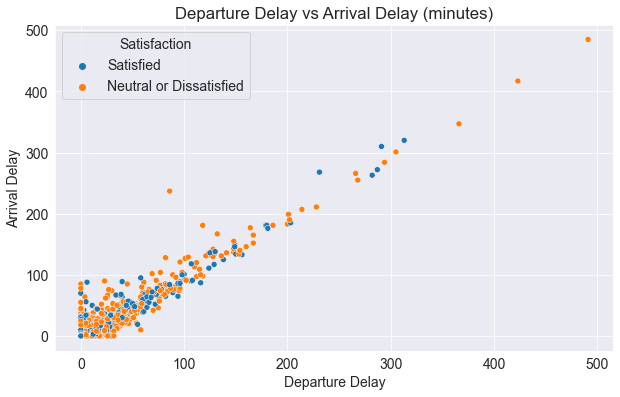

In [18]:
sns.scatterplot(data=data_df.sample(2000), x='Departure Delay', y='Arrival Delay', hue='Satisfaction');
plt.title('Departure Delay vs Arrival Delay (minutes)');

The data visualization and exploratory data analysis performed in the above lines of code helps to identify some patterns the different input data present between them in order to assess which of them have a major impact on the model evaluation.  

The next step before we start training models and making predictions, will be to split our dataset in  a `training`,`validation` and  `test` set. The first will be used to train the  model based on the data, the second to validate the predictions of our model and the last one to validate the models final accuracy. The split will go as follows:
train set: 60% of our total data, validation & test set: 20% each

Since the rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test and validation sets. This can be done using the `train_test_split` utility from `scikit-learn`

In [19]:
from sklearn.model_selection import train_test_split

In [20]:
train_val_df,test_df=train_test_split(data_df,test_size=0.2,random_state=42)
#test_size goes to 20% of the samples to the test_df and the rest to train_val_df
#random_state takes the samples from a predefined state
train_df,val_df = train_test_split(train_val_df,test_size=0.25,random_state=42)

In [21]:
print(train_df.shape)
print(val_df.shape)
print(test_df.shape)

(77928, 24)
(25976, 24)
(25976, 24)


In [22]:
train_df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
73461,73462,Male,49,Returning,Personal,Economy,1120,0,0.0,4,...,5,3,3,3,3,5,2,3,5,Neutral or Dissatisfied
70536,70537,Female,43,Returning,Business,Business,2539,0,0.0,1,...,4,4,4,5,4,4,1,4,4,Satisfied
13024,13025,Female,34,Returning,Personal,Economy,374,2,0.0,4,...,5,4,4,4,4,4,3,4,5,Neutral or Dissatisfied
18870,18871,Male,21,Returning,Business,Business,2676,0,0.0,1,...,1,3,2,3,3,2,3,3,3,Neutral or Dissatisfied
16294,16295,Female,38,Returning,Business,Economy Plus,748,0,0.0,3,...,4,5,5,5,5,1,5,5,1,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107609,107610,Male,75,Returning,Business,Business,3004,102,96.0,4,...,3,3,3,4,3,3,3,3,3,Neutral or Dissatisfied
66761,66762,Male,51,Returning,Personal,Economy,802,73,49.0,5,...,2,1,2,1,1,1,3,1,5,Neutral or Dissatisfied
56044,56045,Female,44,First-time,Business,Economy,2475,0,0.0,2,...,5,3,4,3,2,4,2,3,3,Neutral or Dissatisfied
82012,82013,Female,39,First-time,Business,Economy,1135,0,0.0,2,...,2,1,3,1,1,3,2,1,3,Neutral or Dissatisfied


In [23]:
val_df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
118936,118937,Male,43,First-time,Business,Economy,1618,6,0.0,3,...,4,4,4,2,2,3,3,2,4,Neutral or Dissatisfied
17492,17493,Male,51,Returning,Business,Economy,352,17,12.0,2,...,3,2,5,2,2,2,2,2,2,Neutral or Dissatisfied
23380,23381,Male,28,Returning,Business,Economy Plus,1162,0,0.0,3,...,3,4,2,4,4,2,4,4,2,Neutral or Dissatisfied
96883,96884,Female,70,Returning,Personal,Economy,781,0,0.0,5,...,4,5,1,4,2,4,1,4,4,Neutral or Dissatisfied
56045,56046,Male,24,First-time,Business,Economy,1130,0,0.0,2,...,2,1,3,1,2,1,2,4,4,Neutral or Dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12629,12630,Male,24,First-time,Business,Economy,844,0,0.0,0,...,3,1,4,1,1,2,0,1,2,Satisfied
78242,78243,Female,41,Returning,Business,Business,1586,0,0.0,5,...,2,5,2,4,3,2,0,2,2,Satisfied
26242,26243,Female,43,Returning,Personal,Economy,270,0,0.0,3,...,2,3,0,4,3,2,1,2,1,Neutral or Dissatisfied
4622,4623,Female,42,Returning,Business,Business,2089,0,0.0,2,...,2,4,2,4,5,2,2,2,2,Satisfied


In [24]:
test_df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
103044,103045,Male,23,First-time,Business,Economy,546,0,0.0,4,...,3,2,1,2,2,3,3,2,4,Neutral or Dissatisfied
43282,43283,Male,38,Returning,Business,Economy,531,0,0.0,1,...,2,5,2,5,5,3,5,5,1,Satisfied
65543,65544,Male,33,Returning,Business,Business,237,0,3.0,3,...,3,4,4,4,4,5,3,4,4,Satisfied
65083,65084,Male,68,Returning,Personal,Economy,224,0,0.0,3,...,2,1,2,1,1,5,4,1,3,Satisfied
76496,76497,Male,27,First-time,Business,Business,516,7,0.0,5,...,4,1,3,4,4,5,5,4,4,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121239,121240,Female,34,Returning,Business,Business,2075,80,81.0,1,...,2,4,2,2,1,2,2,2,2,Neutral or Dissatisfied
6010,6011,Male,22,First-time,Business,Economy,630,0,46.0,3,...,4,1,1,1,1,2,1,1,2,Neutral or Dissatisfied
101127,101128,Female,60,Returning,Business,Business,3639,6,0.0,2,...,4,5,4,5,2,4,2,4,4,Satisfied
82323,82324,Female,38,Returning,Business,Business,2005,38,80.0,3,...,2,4,2,4,3,2,2,2,2,Neutral or Dissatisfied


### Input and Target columns

In this section we will identify our input and our target columns for the models we will train in the next section

In [25]:
input_cols = list(train_df.columns)[1:-1]
target_cols='Satisfaction'

In [26]:
print(input_cols)

['Gender', 'Age', 'Customer Type', 'Type of Travel', 'Class', 'Flight Distance', 'Departure Delay', 'Arrival Delay', 'Departure and Arrival Time Convenience', 'Ease of Online Booking', 'Check-in Service', 'Online Boarding', 'Gate Location', 'On-board Service', 'Seat Comfort', 'Leg Room Service', 'Cleanliness', 'Food and Drink', 'In-flight Service', 'In-flight Wifi Service', 'In-flight Entertainment', 'Baggage Handling']


In [27]:
print(target_cols)

Satisfaction


In [28]:
train_inputs= train_df[input_cols].copy()
train_targets= train_df[target_cols].copy()

In [29]:
val_inputs= val_df[input_cols].copy()
val_targets= val_df[target_cols].copy()

In [30]:
test_inputs= test_df[input_cols].copy()
test_targets= test_df[target_cols].copy()

In [31]:
train_inputs

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,...,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
73461,Male,49,Returning,Personal,Economy,1120,0,0.0,4,2,...,2,5,3,3,3,3,5,2,3,5
70536,Female,43,Returning,Business,Business,2539,0,0.0,1,1,...,1,4,4,4,5,4,4,1,4,4
13024,Female,34,Returning,Personal,Economy,374,2,0.0,4,5,...,3,5,4,4,4,4,4,3,4,5
18870,Male,21,Returning,Business,Business,2676,0,0.0,1,2,...,1,1,3,2,3,3,2,3,3,3
16294,Female,38,Returning,Business,Economy Plus,748,0,0.0,3,2,...,3,4,5,5,5,5,1,5,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107609,Male,75,Returning,Business,Business,3004,102,96.0,4,4,...,4,3,3,3,4,3,3,3,3,3
66761,Male,51,Returning,Personal,Economy,802,73,49.0,5,3,...,3,2,1,2,1,1,1,3,1,5
56044,Female,44,First-time,Business,Economy,2475,0,0.0,2,2,...,4,5,3,4,3,2,4,2,3,3
82012,Female,39,First-time,Business,Economy,1135,0,0.0,2,2,...,3,2,1,3,1,1,3,2,1,3


In [32]:
train_targets

73461     Neutral or Dissatisfied
70536                   Satisfied
13024     Neutral or Dissatisfied
18870     Neutral or Dissatisfied
16294                   Satisfied
                   ...           
107609    Neutral or Dissatisfied
66761     Neutral or Dissatisfied
56044     Neutral or Dissatisfied
82012     Neutral or Dissatisfied
54156     Neutral or Dissatisfied
Name: Satisfaction, Length: 77928, dtype: object

Now, it would be useful to identify which of the input columns are categorical and which are numerical 

### Imputing missing numeric Values



Machine learning models are not working with NaN values and missing numerical data. The process of filling missing values is called imputation. We will use the `SimpleImputer` to replace the missing values with the mean or the average of the respective columns

In [33]:
numeric_cols= train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()


In [34]:
print(numeric_cols)

['Age', 'Flight Distance', 'Departure Delay', 'Arrival Delay', 'Departure and Arrival Time Convenience', 'Ease of Online Booking', 'Check-in Service', 'Online Boarding', 'Gate Location', 'On-board Service', 'Seat Comfort', 'Leg Room Service', 'Cleanliness', 'Food and Drink', 'In-flight Service', 'In-flight Wifi Service', 'In-flight Entertainment', 'Baggage Handling']


In [35]:
print(categorical_cols)

['Gender', 'Customer Type', 'Type of Travel', 'Class']


In [36]:
from sklearn.impute import SimpleImputer

In [37]:
imputer= SimpleImputer(strategy='mean')

In [38]:
imputer.fit(data_df[numeric_cols])

SimpleImputer()

In [39]:
list(imputer.statistics_)

[39.42795657530028,
 1190.3163920542038,
 14.713712657838004,
 15.09112883918849,
 3.0575993224514937,
 2.7568755774561136,
 3.3062673236834,
 3.252633199876809,
 2.976924853711118,
 3.3830227902679395,
 3.4413612565445026,
 3.3508777332922697,
 3.286325839236218,
 3.2047736372035724,
 3.6421927933477054,
 2.7286957191253465,
 3.358076686171851,
 3.632114259316292]

In [40]:
train_inputs[numeric_cols]=imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]=imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]=imputer.transform(test_inputs[numeric_cols])

In [41]:
train_inputs[numeric_cols].isna().sum()

Age                                       0
Flight Distance                           0
Departure Delay                           0
Arrival Delay                             0
Departure and Arrival Time Convenience    0
Ease of Online Booking                    0
Check-in Service                          0
Online Boarding                           0
Gate Location                             0
On-board Service                          0
Seat Comfort                              0
Leg Room Service                          0
Cleanliness                               0
Food and Drink                            0
In-flight Service                         0
In-flight Wifi Service                    0
In-flight Entertainment                   0
Baggage Handling                          0
dtype: int64

### One-Hot-Encoding

As it is known, the ML model cannot work with categorical data so we have to convert them to Numeric by performing One Hot Encoding

In [42]:
data_df[categorical_cols].nunique()

Gender            2
Customer Type     2
Type of Travel    2
Class             3
dtype: int64

In [43]:
data_df['Class'].unique()

array(['Business', 'Economy', 'Economy Plus'], dtype=object)

In [44]:
from sklearn.preprocessing import OneHotEncoder

In [45]:
encoder=OneHotEncoder(sparse=False,handle_unknown='ignore')

In [46]:
encoder.fit(data_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [47]:
encoder.categories_

[array(['Female', 'Male'], dtype=object),
 array(['First-time', 'Returning'], dtype=object),
 array(['Business', 'Personal'], dtype=object),
 array(['Business', 'Economy', 'Economy Plus'], dtype=object)]

In [48]:
encoded_cols= list(encoder.get_feature_names(categorical_cols))
print(encoded_cols)

['Gender_Female', 'Gender_Male', 'Customer Type_First-time', 'Customer Type_Returning', 'Type of Travel_Business', 'Type of Travel_Personal', 'Class_Business', 'Class_Economy', 'Class_Economy Plus']


C:\Users\iokom\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [49]:
train_inputs[encoded_cols]= encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols]= encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols]= encoder.transform(test_inputs[categorical_cols])

In [50]:
train_inputs

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,...,Baggage Handling,Gender_Female,Gender_Male,Customer Type_First-time,Customer Type_Returning,Type of Travel_Business,Type of Travel_Personal,Class_Business,Class_Economy,Class_Economy Plus
73461,Male,49.0,Returning,Personal,Economy,1120.0,0.0,0.0,4.0,2.0,...,5.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
70536,Female,43.0,Returning,Business,Business,2539.0,0.0,0.0,1.0,1.0,...,4.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
13024,Female,34.0,Returning,Personal,Economy,374.0,2.0,0.0,4.0,5.0,...,5.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
18870,Male,21.0,Returning,Business,Business,2676.0,0.0,0.0,1.0,2.0,...,3.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
16294,Female,38.0,Returning,Business,Economy Plus,748.0,0.0,0.0,3.0,2.0,...,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107609,Male,75.0,Returning,Business,Business,3004.0,102.0,96.0,4.0,4.0,...,3.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
66761,Male,51.0,Returning,Personal,Economy,802.0,73.0,49.0,5.0,3.0,...,5.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
56044,Female,44.0,First-time,Business,Economy,2475.0,0.0,0.0,2.0,2.0,...,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
82012,Female,39.0,First-time,Business,Economy,1135.0,0.0,0.0,2.0,2.0,...,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


### Scaling of Numeric values

In [51]:
data_df[numeric_cols].describe()

,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


A good practise is to scale numbers to a small range of values e.g. (0,1) or(-1,1).This will ensure that no particular feature will have a disproportional impact on the model's loss. In addition, optimization algorithms works better with small numbers.

In [52]:
from sklearn.preprocessing import MinMaxScaler

In [53]:
scaler = MinMaxScaler()

In [54]:
scaler.fit(data_df[numeric_cols])

MinMaxScaler()

In [55]:
scaler.data_min_

array([ 7., 31.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  1.])

In [56]:
scaler.data_max_

array([  85., 4983., 1592., 1584.,    5.,    5.,    5.,    5.,    5.,
          5.,    5.,    5.,    5.,    5.,    5.,    5.,    5.,    5.])

In [57]:
train_inputs[numeric_cols]= scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]= scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]= scaler.transform(test_inputs[numeric_cols])

In [58]:
train_inputs

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,...,Baggage Handling,Gender_Female,Gender_Male,Customer Type_First-time,Customer Type_Returning,Type of Travel_Business,Type of Travel_Personal,Class_Business,Class_Economy,Class_Economy Plus
73461,Male,0.538462,Returning,Personal,Economy,0.219911,0.000000,0.000000,0.8,0.4,...,1.00,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
70536,Female,0.461538,Returning,Business,Business,0.506462,0.000000,0.000000,0.2,0.2,...,0.75,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
13024,Female,0.346154,Returning,Personal,Economy,0.069265,0.001256,0.000000,0.8,1.0,...,1.00,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
18870,Male,0.179487,Returning,Business,Business,0.534128,0.000000,0.000000,0.2,0.4,...,0.50,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
16294,Female,0.397436,Returning,Business,Economy Plus,0.144790,0.000000,0.000000,0.6,0.4,...,0.00,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107609,Male,0.871795,Returning,Business,Business,0.600363,0.064070,0.060606,0.8,0.8,...,0.50,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
66761,Male,0.564103,Returning,Personal,Economy,0.155695,0.045854,0.030934,1.0,0.6,...,1.00,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
56044,Female,0.474359,First-time,Business,Economy,0.493538,0.000000,0.000000,0.4,0.4,...,0.50,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
82012,Female,0.410256,First-time,Business,Economy,0.222940,0.000000,0.000000,0.4,0.4,...,0.50,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


### Step 4: Training and validating ML models, Hyperparametrs Tuning and Overfitting Reduction

As it is mentioned in the beginning of the Notebook, this is considered as a `classification` problem so we will use models that can apply in those types of problems:


1) `Logistic regression model`

In [59]:
from sklearn.linear_model import LogisticRegression

In [60]:
# First, we train the model

model =LogisticRegression(solver='liblinear') #liblinear is a good fit for a relatively small dataset such as ours

In [61]:
model.fit(train_inputs[numeric_cols+encoded_cols],train_targets)

LogisticRegression(solver='liblinear')

Let's check and visualize the model coefficients 

In [62]:
print(model.coef_.tolist())

[[-0.7001752793629407, -0.08758498528643832, -2.296798792741734, -4.886894376140836, -0.6262374239005927, -0.8006242700449578, 1.57011493494542, 2.9443968375100456, 0.15249560409856014, 1.503704974788348, 0.3646931119296644, 1.2216024759821091, 1.1700094370615255, -0.17864641994683877, 0.6549820424889384, 1.9989607906098847, 0.2574877028152203, 0.5544765647834727, -1.526442899561327, -1.462459740546127, -2.509724193648622, -0.47917844645976565, -0.14359150762581221, -2.8453111325102025, -0.47708027635627864, -1.2086037614116683, -1.3032186023516463]]


In [63]:
print(model.intercept_.tolist())

[-2.9889026401305943]


Let's see and visualize the weight that each parameter is bearing

In [64]:
weights_df = pd.DataFrame({
    'features': numeric_cols + encoded_cols,
    'weights': model.coef_.tolist()[0]}) #because it is a 2D array and not 1D

In [65]:
weights_df

,features,weights
0,Age,-0.700175
1,Flight Distance,-0.087585
2,Departure Delay,-2.296799
3,Arrival Delay,-4.886894
4,Departure and Arrival Time Convenience,-0.626237
5,Ease of Online Booking,-0.800624
6,Check-in Service,1.570115
7,Online Boarding,2.944397
8,Gate Location,0.152496
9,On-board Service,1.503705


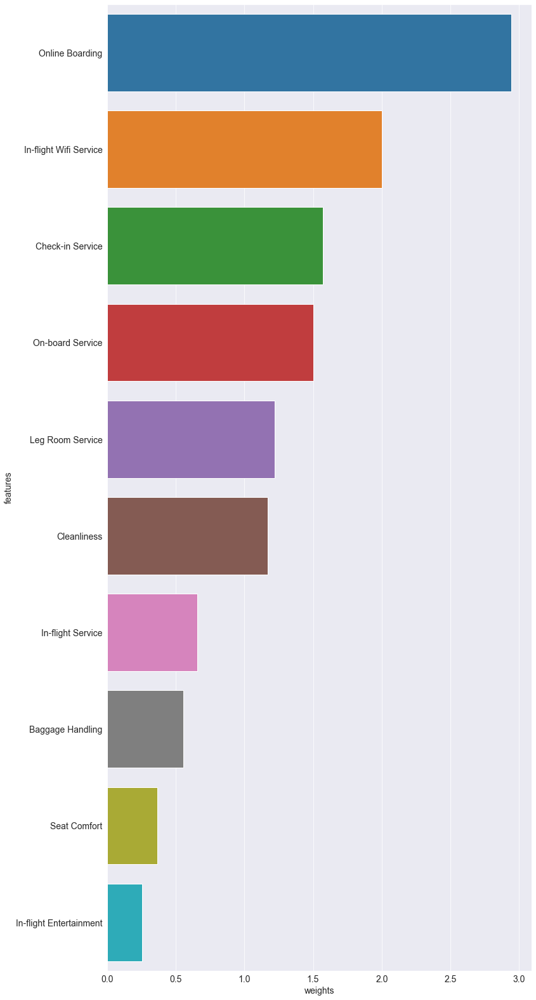

In [66]:
plt.figure(figsize=(12,28))
sns.barplot(data=weights_df.sort_values('weights',ascending=False).head(10),x='weights',y='features');

It's time to make some predictions and evaluate our model

In [67]:
X_train=train_inputs[numeric_cols+encoded_cols]
X_val=val_inputs[numeric_cols+encoded_cols]
X_test=test_inputs[numeric_cols+encoded_cols]

In [68]:
train_preds = model.predict(X_train)

In [69]:
train_preds

array(['Neutral or Dissatisfied', 'Satisfied', 'Satisfied', ...,
       'Neutral or Dissatisfied', 'Neutral or Dissatisfied',
       'Neutral or Dissatisfied'], dtype=object)

In [70]:
train_targets

73461     Neutral or Dissatisfied
70536                   Satisfied
13024     Neutral or Dissatisfied
18870     Neutral or Dissatisfied
16294                   Satisfied
                   ...           
107609    Neutral or Dissatisfied
66761     Neutral or Dissatisfied
56044     Neutral or Dissatisfied
82012     Neutral or Dissatisfied
54156     Neutral or Dissatisfied
Name: Satisfaction, Length: 77928, dtype: object

We can check how well the model has performed by comparing the the percentage of match and mismatch values using `accuracy score`

In [71]:
from sklearn.metrics import accuracy_score

In [72]:
accuracy_score(train_preds,train_targets)

0.8738579201314034

Apart from predictions,the model can give us probabilities.

In [73]:
probs= model.predict_proba(X_train)
probs

array([[0.92367002, 0.07632998],
       [0.04708274, 0.95291726],
       [0.48642924, 0.51357076],
       ...,
       [0.80329491, 0.19670509],
       [0.980478  , 0.019522  ],
       [0.9506956 , 0.0493044 ]])

The model achieves an accuracy of 85.1% on the training set. We can visualize the breakdown of correctly and incorrectly classified inputs using a confusion matrix.

In [74]:
from sklearn.metrics import confusion_matrix

In [75]:
confusion_matrix(train_targets,train_preds, normalize='true')

array([[0.90337068, 0.09662932],
       [0.16458838, 0.83541162]])

Let's define a helper function to generate predictions, compute the accuracy score and plot a confusion matrix for a given set of inputs

In [76]:
def predict_and_plot(inputs,targets,name=''):
    preds=model.predict(inputs)
    accuracy= accuracy_score(targets,preds)
    print('Accuracy: {:.2f}%'.format(accuracy*100))
    
    cf=confusion_matrix(targets,preds,normalize='true')
    plt.figure()
    sns.heatmap(cf,annot=True)
    plt.xlabel('Predictions')
    plt.ylabel('Targets')
    plt.title('{} Confusion Matrix'.format(name))
    return preds
    

Accuracy: 87.39%


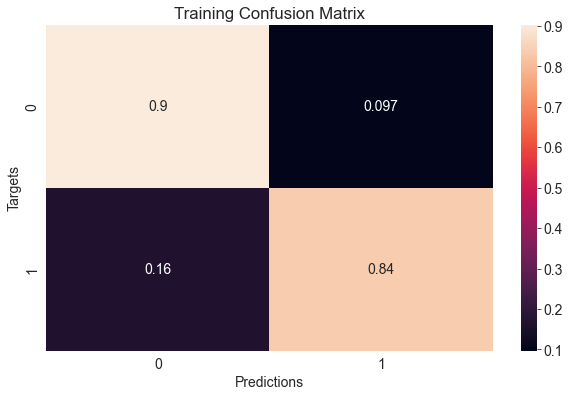

In [77]:
train_preds = predict_and_plot(X_train,train_targets,'Training')

Accuracy: 87.47%


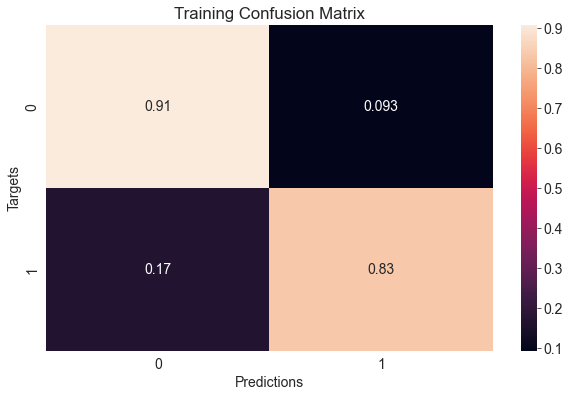

In [78]:
val_preds = predict_and_plot(X_val,val_targets,'Training')

Accuracy: 87.41%


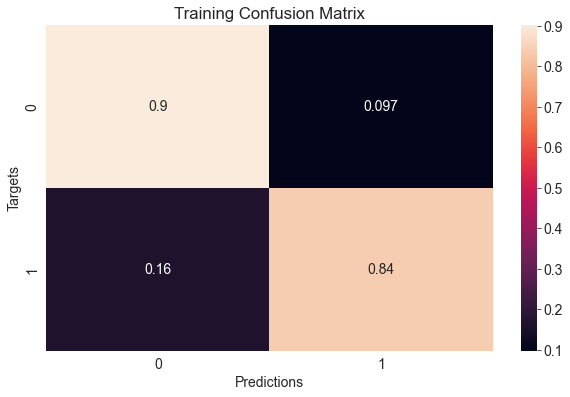

In [79]:
test_preds = predict_and_plot(X_test,test_targets,'Training')

We now define 2 functions: 1 to produce random guess and 1 where we consider all the passengers in the flight as satisfied. The goal is to see how much better our model performs in comparison with those 2 guesses.

In [80]:
def random_guess(inputs):
    return np.random.choice(["Neutral or Dissatisfied", "Satisfied"], len(inputs))

In [81]:
def all_satisfied(inputs):
    return np.full(len(inputs),'Satisfied')

In [82]:
random_guess(X_val)

array(['Neutral or Dissatisfied', 'Neutral or Dissatisfied',
       'Neutral or Dissatisfied', ..., 'Satisfied', 'Satisfied',
       'Neutral or Dissatisfied'], dtype='<U23')

In [83]:
all_satisfied(X_val)

array(['Satisfied', 'Satisfied', 'Satisfied', ..., 'Satisfied',
       'Satisfied', 'Satisfied'], dtype='<U9')

In [84]:
accuracy_score(test_targets, random_guess(X_test))

0.5011164151524484

In [85]:
accuracy_score(test_targets, all_satisfied(X_test))

0.43320757622420697

It's quite good thr fatc that our model performs sighnificantly better than a random and a all satisfied model and thus we can consider it as adequately good

2) `Decision Tree Model`

The second model we are going to train is the based on Decision Trees

In [86]:
from sklearn.tree import DecisionTreeClassifier 

In [87]:
model1= DecisionTreeClassifier(random_state=42)

In [88]:
model1.fit(X_train,train_targets)

DecisionTreeClassifier(random_state=42)

Now that aour model has been trained we will use once again the `accuracy_score` to evaluate its performance

In [89]:
train_preds1= model1.predict(X_train)
train_preds1

array(['Neutral or Dissatisfied', 'Satisfied', 'Neutral or Dissatisfied',
       ..., 'Neutral or Dissatisfied', 'Neutral or Dissatisfied',
       'Neutral or Dissatisfied'], dtype=object)

In [90]:
accuracy_score(train_preds1,train_targets)

1.0

In [91]:
train_probs1=model1.predict_proba(X_train)
train_probs1

array([[1., 0.],
       [0., 1.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]])

The training model seems to give 100% accuracy but we cannot rely on that. We have to assess its performance on the validation set as well.

In [92]:
val_preds1=model1.predict(X_val)
val_preds1

array(['Neutral or Dissatisfied', 'Neutral or Dissatisfied',
       'Neutral or Dissatisfied', ..., 'Neutral or Dissatisfied',
       'Satisfied', 'Neutral or Dissatisfied'], dtype=object)

In [93]:
accuracy_score(val_preds1,val_targets)

0.9456036341238065

In [94]:
val_probs1= model1.predict_proba(X_val)
val_probs1

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

It appears that model1 has learned the training examples perfect, and doesn't generalize equally well as to previously unseen examples (although it is performing quite well to those as well). This phenomenon is called "overfitting", and reducing overfitting is one of the most important parts of any machine learning project. 

First, we will try to visualize our tree  and understand what is happening in the Decision Tree Model and we will try to tune the `Hyperparameters` and reduce the overfitting (a process known as `Regularization`) so that our model will perform even better in the validation set.

In [95]:
from sklearn.tree import plot_tree,export_text

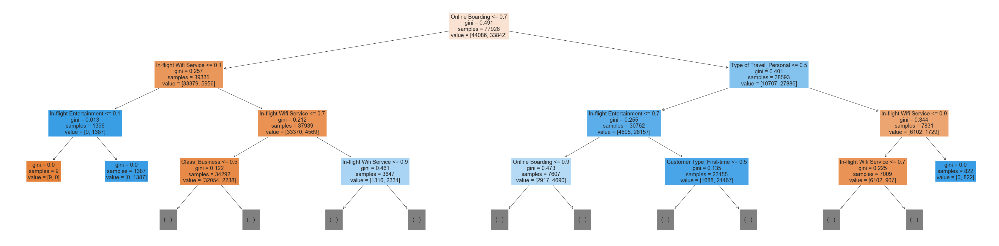

In [96]:
#Plotting of the Tree
plt.figure(figsize=(60,15))
plot_tree(model1, feature_names=X_train.columns, max_depth=3, filled=True);

In [97]:
#Checking on the tree depth
model1.tree_.max_depth

35

In [98]:
#Illustrating the tree as a text
tree_text=export_text(model1,feature_names=list(X_train.columns),max_depth=8)
print(tree_text[:4000])

|--- Online Boarding <= 0.70
|   |--- In-flight Wifi Service <= 0.10
|   |   |--- In-flight Entertainment <= 0.10
|   |   |   |--- class: Neutral or Dissatisfied
|   |   |--- In-flight Entertainment >  0.10
|   |   |   |--- class: Satisfied
|   |--- In-flight Wifi Service >  0.10
|   |   |--- In-flight Wifi Service <= 0.70
|   |   |   |--- Class_Business <= 0.50
|   |   |   |   |--- Ease of Online Booking <= 0.70
|   |   |   |   |   |--- Type of Travel_Business <= 0.50
|   |   |   |   |   |   |--- class: Neutral or Dissatisfied
|   |   |   |   |   |--- Type of Travel_Business >  0.50
|   |   |   |   |   |   |--- Customer Type_First-time <= 0.50
|   |   |   |   |   |   |   |--- Check-in Service <= 0.90
|   |   |   |   |   |   |   |   |--- Baggage Handling <= 0.88
|   |   |   |   |   |   |   |   |   |--- truncated branch of depth 25
|   |   |   |   |   |   |   |   |--- Baggage Handling >  0.88
|   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   | 

Feature importance: Based on the Gini index, i.e a loss function used by the decision tree to decide which column should be used for splitting the data, and at what point the column should be split (the smaller the better), a decision tree assigns an'importance' value to each feature. These values can be used to interpret the results given by a decision tree.

In [99]:
model1.feature_importances_

array([0.02309746, 0.02350402, 0.00708139, 0.00813456, 0.00620758,
       0.00367762, 0.02798757, 0.35971064, 0.02087746, 0.00894175,
       0.01662381, 0.00809282, 0.01152225, 0.00354742, 0.01389894,
       0.17651988, 0.04760799, 0.01972499, 0.00137357, 0.00141426,
       0.0313297 , 0.00935186, 0.01559866, 0.13296823, 0.01962115,
       0.00115599, 0.00042841])

In [100]:
importance_df= pd.DataFrame({
    'feature':X_train.columns,
    'importance':model1.feature_importances_})

In [101]:
importance_df.head(10)

,feature,importance
0,Age,0.023097
1,Flight Distance,0.023504
2,Departure Delay,0.007081
3,Arrival Delay,0.008135
4,Departure and Arrival Time Convenience,0.006208
5,Ease of Online Booking,0.003678
6,Check-in Service,0.027988
7,Online Boarding,0.359711
8,Gate Location,0.020877
9,On-board Service,0.008942


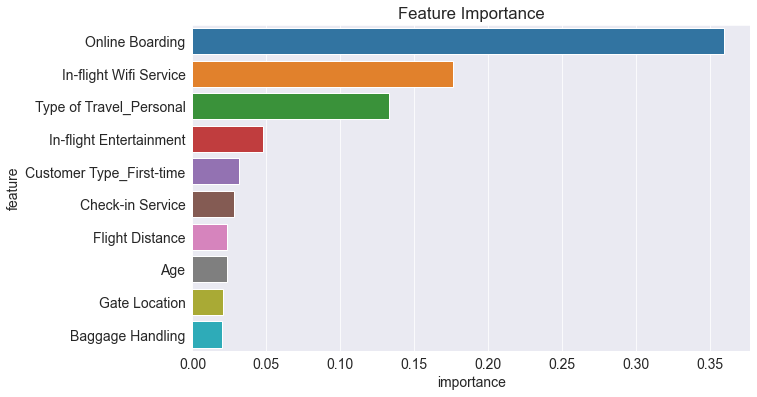

In [102]:
#Let's plot the most important features of the DataFrame
plt.title('Feature Importance')
sns.barplot(data=importance_df.sort_values('importance',ascending=False).head(10), x='importance', y= 'feature');

Now, we will try to reduce overfitting by tuning some of the Hyperparameters (input argumnents that the `DecisionTreeClassifier` accepts) and by that we hope that we will manage to improve the performance of our model in the validation set as well.

In [103]:
#let's check some of the input argumets the DecisiontreeClassifier takes
?DecisionTreeClassifier

Let's define a function that it will help as test a number of different values for the Hyperparameters to decide which set of them improves the performance of our model

In [104]:
def test_parameters(**parameters):
    model1=DecisionTreeClassifier(random_state=42, **parameters).fit(X_train,train_targets)
    return model1.score(X_train,train_targets), model1.score(X_val,val_targets)

In [105]:
test_parameters(max_depth=3)

(0.8836618417000308, 0.8884354789036033)

In [106]:
test_parameters(max_depth=10)

(0.9519043219381994, 0.945642131198029)

In [107]:
test_parameters(max_depth=13)

(0.9669566779591418, 0.9513012011087157)

In [108]:
test_parameters(max_depth=20)

(0.9902217431475208, 0.9488373883584847)

In [109]:
test_parameters(max_depth=15)

(0.9743866132840571, 0.9527640899291654)

In [110]:
test_parameters(max_depth=16)

(0.9783261472128119, 0.9528025870033877)

In [111]:
test_parameters(max_depth=17)

(0.9817652191766759, 0.951647674776717)

So, it looks that reducing the `max_depth`of the tree in 16 improves the predictions in the validation set by almost 1%.

Lets now check the other hyperparameter `max_leaf_nodes` 

In [112]:
test_parameters(max_leaf_nodes=120)

(0.9522636279642747, 0.9499153064367108)

In [113]:
test_parameters(max_leaf_nodes=150)

(0.956151832460733, 0.9531875577456114)

In [114]:
test_parameters(max_leaf_nodes=200)

(0.9591289395339287, 0.9549199260856175)

In [115]:
test_parameters(max_leaf_nodes=300)

(0.9629914793142388, 0.956151832460733)

In [116]:
test_parameters(max_leaf_nodes=400)

(0.9663150600554358, 0.9567677856482907)

In [117]:
test_parameters(max_leaf_nodes=500)

(0.9690098552510009, 0.956575300277179)

Le'ts now try to combine the 2 Hyperparameters

In [118]:
test_parameters(max_depth=16,max_leaf_nodes=400)

(0.9654681244225439, 0.9563828149060671)

In [119]:
test_parameters(max_depth=20,max_leaf_nodes=400)

(0.9663022276973616, 0.9569602710194025)

In [120]:
test_parameters(max_depth=18,max_leaf_nodes=400)

(0.9658915922389898, 0.9564983061287342)

In [121]:
test_parameters(max_depth=22,max_leaf_nodes=400)

(0.9662893953392876, 0.9566522944256236)

In [122]:
test_parameters(max_depth=20,max_leaf_nodes=300)

(0.9629529822400165, 0.9563058207576224)

In [123]:
test_parameters(max_depth=20,max_leaf_nodes=500)

(0.9688943640283338, 0.9569987680936248)

In [124]:
test_parameters(max_depth=20,max_leaf_nodes=600)

(0.9714480032850836, 0.9564983061287342)

In [125]:
test_parameters(max_depth=20,max_leaf_nodes=550)

(0.9705369058618212, 0.9570372651678473)

After various test with the Hypeparameters, we conclude that the Last combination of `max_depth=20,max_leaf_nodes=550` is the best and improves our prediction by ~1,2 % which it can be considered as a significant improvement considering that our model was already performed quite well.


Another way we could have assess our model performance would have been to create another helper function


def max_depth_error(md):
    model = DecisionTreeClassifier(max_depth=md,random_state=42)
    model.fit(X_train,train_targets)
    train_error = 1- model.score(X_train,train_targets)
    val_error = 1-model.score(X_val,val_targets)
    return {'Max Depth':md,'Training Error':train_error,'Validation Error':val_error}


and create a DataFrame 


errors_df= pd.DataFrame([max_depth_error(md) for md in range(1,21)]) to check in which depth the model performs better. The same method can be applied  applied for the `max_lean_nodes`

3) `Random Forests`

The 3rd model we will attempt to train is based on Random Forests

In [126]:
from sklearn.ensemble import RandomForestClassifier

In [127]:
?RandomForestClassifier

In [128]:
model2= RandomForestClassifier(n_jobs=-1, random_state=42)

In [129]:
model2.fit(X_train,train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [130]:
model2.score(X_train,train_targets)

1.0

In [131]:
model2.score(X_val,val_targets)

0.9620033877425316

In the first glance, it seems that our model performs even better comparing with both logistic regression and Decision trees. However, there is still some overfitting that we have and we will try to reduce


In [132]:
model2.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=1608637542)

In [133]:
len(model2.estimators_)

100

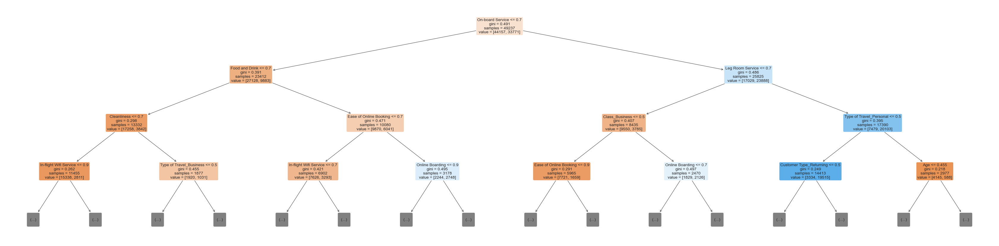

In [134]:
#Once again, we start by visualizinf the trees
plt.figure(figsize=(60,15))
plot_tree(model2.estimators_[0], feature_names=X_train.columns, max_depth=3, filled=True,rounded=True);

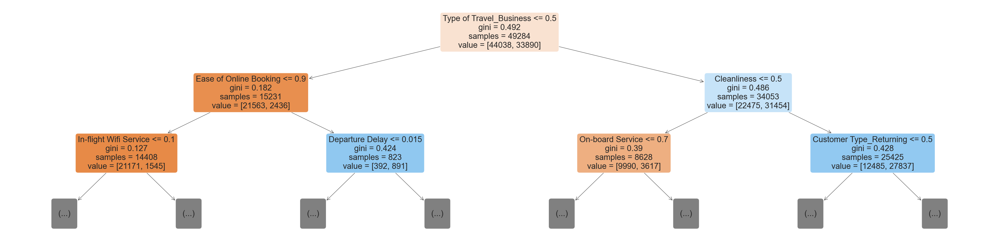

In [135]:
plt.figure(figsize=(60,15))
plot_tree(model2.estimators_[20],max_depth=2,feature_names=X_train.columns,filled=True,rounded=True);

In [136]:
importance1_df=pd.DataFrame({
    'feature':X_train.columns,
    'importance':model2.feature_importances_
}).sort_values('importance',ascending=False)

In [137]:
importance1_df.head(10)

,feature,importance
15,In-flight Wifi Service,0.142978
7,Online Boarding,0.137458
24,Class_Business,0.083427
23,Type of Travel_Personal,0.061934
22,Type of Travel_Business,0.058242
16,In-flight Entertainment,0.055627
10,Seat Comfort,0.044970
5,Ease of Online Booking,0.035913
11,Leg Room Service,0.032033
25,Class_Economy,0.031536


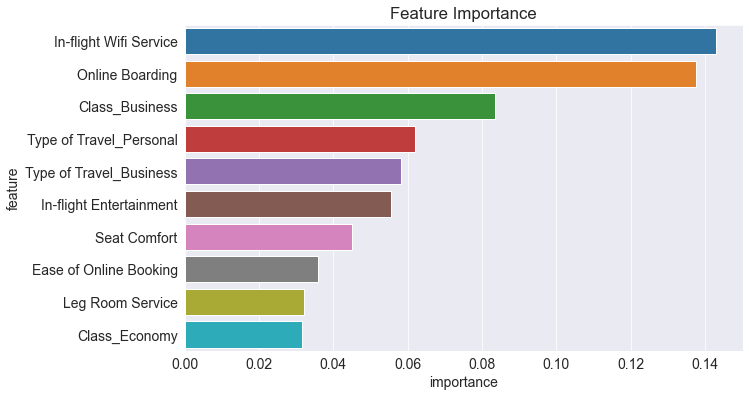

In [138]:
plt.title('Feature Importance')
sns.barplot(data=importance1_df.sort_values('importance',ascending=False).head(10),x='importance',y='feature');

Just like decision trees, Random Forests also have several hyperparameters which we will to modify properly to reduce overfitting and improve our model performance.

First, same as with decision trees, we define a Helper functions that it will help us test several hyperparameters

In [139]:
def test_parameters1(**parameters):
    model2=RandomForestClassifier(n_jobs=-1,random_state=42,**parameters).fit(X_train,train_targets)
    return model2.score(X_train,train_targets), model2.score(X_val,val_targets)

First, let's deal with the `max_depth` parameter

In [140]:
def max_depth_error(md):
    model2 = RandomForestClassifier(max_depth=md,n_jobs=-1,random_state=42)
    model2.fit(X_train,train_targets)
    train_error = model2.score(X_train,train_targets)
    val_error = model2.score(X_val,val_targets)
    return {'Max Depth':md,'Training Error':train_error,'Validation Error':val_error}

In [141]:
errors_df= pd.DataFrame([max_depth_error(md) for md in range(1,27)])

In [142]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,0.835784,0.837850
1,2,0.874602,0.878272
2,3,0.894184,0.896366
3,4,0.906465,0.908146
4,5,0.924007,0.924700
5,6,0.930538,0.931360
6,7,0.935517,0.935171
7,8,0.939483,0.938520
8,9,0.943615,0.941869
9,10,0.950685,0.947259


In [143]:
test_parameters1(max_depth=26)

(0.9994995380351094, 0.9625038497074222)

It seems that `max_depth` 26 corresponds to the best possible outcome

Now let's try to optimize the hyperparameter `n_estimators`

In [144]:
test_parameters1(n_estimators=10)

(0.9967149163330253, 0.9574222359100708)

In [145]:
test_parameters1(n_estimators=20)

(0.9993327173801457, 0.9604250076994149)

In [146]:
test_parameters1(n_estimators=30)

(0.9996406939739246, 0.9616954111487527)

In [147]:
test_parameters1(n_estimators=50)

(0.9999358382096294, 0.9622343701878657)

In [148]:
test_parameters1(n_estimators=70)

(0.9999871676419259, 0.9620033877425316)

In [149]:
test_parameters1(n_estimators=100)

(1.0, 0.9620033877425316)

In [150]:
%%time
test_parameters1(n_estimators=150)

Wall time: 9.55 s


(1.0, 0.9627733292269788)

In [151]:
%%time
test_parameters1(n_estimators=200)

Wall time: 10.4 s


(1.0, 0.9625038497074222)

Seems that `n_estimators` equal 150 improves the model performance

`max_leaf_nodes`

In [152]:
test_parameters1(max_leaf_nodes=1050)

(0.9739631454676111, 0.9593470896211888)

In [153]:
%%time
test_parameters1(max_leaf_nodes=2**20)

Wall time: 7.47 s


(1.0, 0.9617339082229751)

In [154]:
%%time
test_parameters1(max_leaf_nodes=10000000)

Wall time: 29 s


(1.0, 0.9617339082229751)

In [155]:
%%time
test_parameters1(max_leaf_nodes=10000)

Wall time: 5.66 s


(1.0, 0.9617339082229751)

In [156]:
%%time
test_parameters1(max_leaf_nodes=5000)

Wall time: 5.67 s


(1.0, 0.9617339082229751)

It seems that `max_leaf_nodes` is not influencing the result significantly so we will stay with its default value

`max_features`

In [157]:
%%time
test_parameters1(max_features='log2')

Wall time: 4.86 s


(1.0, 0.9610409608869726)

In [158]:
%%time
test_parameters1(max_features=10)

Wall time: 7.38 s


(1.0, 0.963543270711426)

In [159]:
%%time
test_parameters1(max_features=20)

Wall time: 11.8 s


(1.0, 0.9633122882660918)

In [160]:
%%time
test_parameters1(max_features=5)

Wall time: 4.85 s


(1.0, 0.9620033877425316)

In [161]:
%%time
test_parameters1(max_features=15)

Wall time: 9.74 s


(1.0, 0.9641592238989837)

In [162]:
%%time
test_parameters1(max_features=13)

Wall time: 9.27 s


(1.0, 0.9638897443794272)

In [163]:
%%time
test_parameters1(max_features=17)

Wall time: 11.6 s


(1.0, 0.9639282414536495)

It seems that `max_features` equals 17 improves the model performance

`min_impurity_decrease`


In [164]:
%%time
test_parameters1(min_impurity_decrease=1e-6)

Wall time: 4.85 s


(0.9981649727954008, 0.9617724052971974)

In [165]:
%%time
test_parameters1(min_impurity_decrease=1e-2)

Wall time: 2.18 s


(0.8830587208705472, 0.886472128118263)

In [166]:
%%time
test_parameters1(min_impurity_decrease=1e-5)

Wall time: 4.1 s


(0.9784288060774048, 0.9599245457345241)

In [167]:
%%time
test_parameters1(min_impurity_decrease=1e-7)

Wall time: 4.66 s


(0.9999743352838517, 0.9618878965198645)

We will stick with the choise of 1e-6

`bootstrap`, `max_samples` 

In [168]:
%%time
test_parameters1(bootstrap=False)

Wall time: 5.83 s


(1.0, 0.9628118263012011)

In [169]:
%%time
test_parameters1(max_samples=0.9)

Wall time: 4.88 s


(0.9999486705677035, 0.9618109023714198)

In [170]:
%%time
test_parameters1(max_samples=0.8)

Wall time: 4.36 s


(0.9997433528385176, 0.9619263935940868)

In [171]:
%%time
test_parameters1(max_samples=0.7)

Wall time: 3.71 s


(0.9990760702186634, 0.9620418848167539)

In [172]:
%%time
test_parameters1(max_samples=0.6)

Wall time: 3.51 s


(0.9970613900010266, 0.9616184170003079)

We will stick with `bootstrap` False and `max_samples` will be the whole set (max sample can take fraction of the sample set if bootstrap is False)

Let's put them all together

In [173]:
%%time
test_parameters1(max_depth=26, bootstrap=False, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

Wall time: 18.5 s


(0.9992813879478493, 0.9620803818909763)

In [174]:
%%time
test_parameters1(max_depth=26, max_samples=0.7, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

Wall time: 11.7 s


(0.9976645108305102, 0.9632352941176471)

In [175]:
%%time
test_parameters1(max_depth=26, max_samples=0.7, min_impurity_decrease=1e-7, max_features=17,n_estimators=200)

Wall time: 18.3 s


(0.9982676316599939, 0.9632352941176471)

In [176]:
%%time
test_parameters1(max_depth=30, max_samples=0.7, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

Wall time: 13.8 s


(0.9981649727954008, 0.9639282414536495)

In [177]:
%%time
test_parameters1(max_depth=35, max_samples=0.7, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

Wall time: 14.8 s


(0.9983574581665127, 0.9643132121958731)

In [178]:
%%time
test_parameters1(max_depth=35, max_samples=0.8, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

Wall time: 13.8 s


(0.9988964172056257, 0.9634662765629812)

Let's introduce another hyperparameter that we believe it can reduce perhaps the overfitting even more. this is the Hyperparameter`class_weight`

In [179]:
(train_targets.value_counts()/len(train_targets)) *100

Neutral or Dissatisfied    56.572734
Satisfied                  43.427266
Name: Satisfaction, dtype: float64

In [180]:
model2.classes_

array(['Neutral or Dissatisfied', 'Satisfied'], dtype=object)

In [181]:
test_parameters1(class_weight='balanced')

(1.0, 0.9630813058207576)

In [182]:
test_parameters1(class_weight={'Neutral or Dissatisfied':3,'Satisfied':2})

(1.0, 0.962272867262088)

Back on assembling them all together:

In [183]:
%%time
test_parameters1(max_depth=35, max_samples=0.7, min_impurity_decrease=1e-6, max_features=17,n_estimators=150,class_weight='balanced')

Wall time: 11.7 s


(0.9983446258084385, 0.963543270711426)

After many tests, it seems that the model performs better with the following set of hyperparameters:

In [184]:
test_parameters1(max_depth=35, max_samples=0.7, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

(0.9983574581665127, 0.9643132121958731)

Although we have slightly improved the performance of our model by reducing overfitting and tuning the Hyperparameters, we should take into consideration that the Random Forest model performed significantly well already and thus few things could have been done to improve it.

### Step 5: Summarizing the results and the work we performed

In total in this Notebook, we have trained and perform 3 models:


1) A Logistic Regression Model

2) A Decision Tree 

3) A Random Forest

all well suited for a classification problem such as the one we dealt with

The results for the 3 models are:

`Logistic Regresssion Model`

Accuracy: 87.47%


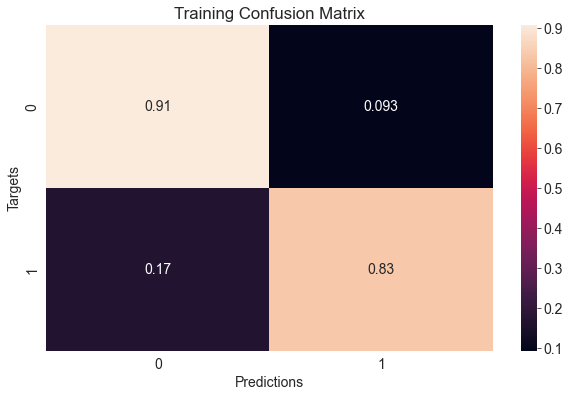

In [185]:
val_preds = predict_and_plot(X_val,val_targets,'Training')

In [186]:
weights_df

,features,weights
0,Age,-0.700175
1,Flight Distance,-0.087585
2,Departure Delay,-2.296799
3,Arrival Delay,-4.886894
4,Departure and Arrival Time Convenience,-0.626237
5,Ease of Online Booking,-0.800624
6,Check-in Service,1.570115
7,Online Boarding,2.944397
8,Gate Location,0.152496
9,On-board Service,1.503705


`Decision Tree`

In [187]:
test_parameters(max_depth=20,max_leaf_nodes=550)

(0.9705369058618212, 0.9570372651678473)

In [188]:
importance_df.head(10)

,feature,importance
0,Age,0.023097
1,Flight Distance,0.023504
2,Departure Delay,0.007081
3,Arrival Delay,0.008135
4,Departure and Arrival Time Convenience,0.006208
5,Ease of Online Booking,0.003678
6,Check-in Service,0.027988
7,Online Boarding,0.359711
8,Gate Location,0.020877
9,On-board Service,0.008942


`Random Forest`

In [189]:
test_parameters1(max_depth=35, max_samples=0.7, min_impurity_decrease=1e-6, max_features=17,n_estimators=150)

(0.9983574581665127, 0.9643132121958731)

In [190]:
importance_df.head(10)

,feature,importance
0,Age,0.023097
1,Flight Distance,0.023504
2,Departure Delay,0.007081
3,Arrival Delay,0.008135
4,Departure and Arrival Time Convenience,0.006208
5,Ease of Online Booking,0.003678
6,Check-in Service,0.027988
7,Online Boarding,0.359711
8,Gate Location,0.020877
9,On-board Service,0.008942


All 3 models perform quite well, and especially the Decision tree and the Random Forest are having a close to excellent performance even before the tuning of the Hyperparameters.However, with extensive study on them we manage to improve them further. The weights and importances of the respective models are given above.

Let's save our work

In [191]:
import joblib

In [192]:
airline_satis_log_reg = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_cols,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [193]:
airline_satis_Dec_Tree = {
    'model': model1,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_cols,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [194]:
airline_satis_Rand_For = {
    'model': model2,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_cols,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [195]:
joblib.dump(airline_satis_log_reg,'airline_satis_log_reg.joblib')

['airline_satis_log_reg.joblib']

In [196]:
joblib.dump(airline_satis_Dec_Tree,'airline_satis_Dec_Tree.joblib')

['airline_satis_Dec_Tree.joblib']

In [197]:
joblib.dump(airline_satis_Rand_For,'airline_satis_Rand_For.joblib')

['airline_satis_Rand_For.joblib']

## Useful links:

1) https://analyticsindiamag.com/understanding-the-maths-behind-the-gini-impurity-method-for-decision-tree-split/#:~:text=Gini%20impurity%20is%20a%20function,values%20from%200%20to%200.5.

2) https://machinelearningmastery.com/a-gentle-introduction-to-the-bootstrap-method/

3) https://towardsdatascience.com/understanding-random-forest-58381e0602d2

4) https://www.springboard.com/blog/data-science/regression-vs-classification/#:~:text=The%20most%20significant%20difference%20between,types%20of%20machine%20learning%20algorithms.

## For the future:

More extensive studies can be performed regarding the satisfaction of the clients in order for the airline companies to assess the most important features that have an impact in the satisfaction of the passengers. Further improvement of the model with perhaps XGBosster could be attempted and, as always, Efforts can be made for further improvement of the model with the reduction of the overfitting.